#Exploring Customer Lifetime Value

In [167]:
#import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

In [168]:
file = "https://raw.githubusercontent.com/rajeevratan84/datascienceforbusiness/master/OnlineRetail.xlsx"
df = pd.read_excel(file, sheet_name = "Online Retail")

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [169]:
df.shape

(541909, 8)

In [170]:
#Let's remove quantities less than zero (probably they were removed)
df = df.loc[df["Quantity"]>0]

In [171]:
#remove empty customer id
df = df[pd.notnull(df["CustomerID"])]

In [172]:
#Let's view our date range


print("Date Range: %s to %s" % (df["InvoiceDate"].min(), df["InvoiceDate"].max()))

Date Range: 2010-12-01 08:26:00 to 2011-12-09 12:50:00


In [173]:
#let's take all transactions that happened before December 01, 2011

df = df.loc[df["InvoiceDate"]<"2011-12-01"]

In [174]:
#Create a Sales Revenue Column

df["Sales"] = df["Quantity"] * df["UnitPrice"]

In [175]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Sales
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34


In [176]:
df["SalesPerDay"] = df.groupby("InvoiceDate")["Sales"].transform('sum')

In [177]:
fig = px.line(df, x="InvoiceDate", y="SalesPerDay", title="Daily Sales")
fig.show()

We can notice some significant spikes. Most popular days in the year among customers were ceirtanly Jan 18(2011), Jun 10 (2011) and Sep 20 (2011). With time the purchases were made mode frequently. The big spikes before probably coincided with PR campaigns

In [178]:
#create an orders summary dataset that shows the total in sales made per customer invoice


orders_df = df.groupby(["CustomerID", "InvoiceNo"]).agg({"Sales": sum, "InvoiceDate": max})

In [179]:
orders_df.head(10)

Sales         InvoiceDate
CustomerID InvoiceNo                              
12346.0    541431     77183.60 2011-01-18 10:01:00
12347.0    537626       711.79 2010-12-07 14:57:00
           542237       475.39 2011-01-26 14:30:00
           549222       636.25 2011-04-07 10:43:00
           556201       382.52 2011-06-09 13:01:00
           562032       584.91 2011-08-02 08:48:00
           573511      1294.32 2011-10-31 12:25:00
12348.0    539318       892.80 2010-12-16 19:09:00
           541998       227.44 2011-01-25 10:42:00
           548955       367.00 2011-04-05 10:47:00

In [180]:
#functions for creating summary dataframe

def groupby_mean(x):
  return x.mean()


def groupby_count(x):
  return x.count()


def purchase_duration(x):
  return (x.max() - x.min()).days

def avg_frequency(x):
  """average days between sales"""
  return (x.max() - x.min()).days/x.count()

groupby_mean.__name__ = "avg"
groupby_count.__name__ = "count"
purchase_duration.__name__ = "purchase_duration"
avg_frequency.__name__ = "purchase_frequency"

summary_df = orders_df.reset_index().groupby("CustomerID").agg({
    'Sales': [min, max, sum, groupby_mean, groupby_count],
    "InvoiceDate": [min, max, purchase_duration, avg_frequency]
})

In [181]:
summary_df.head()

Sales            ...       InvoiceDate                   
                 min       max  ... purchase_duration purchase_frequency
CustomerID                      ...                                     
12346.0     77183.60  77183.60  ...                 0                0.0
12347.0       382.52   1294.32  ...               327               54.5
12348.0       227.44    892.80  ...               282               70.5
12349.0      1757.55   1757.55  ...                 0                0.0
12350.0       334.40    334.40  ...                 0                0.0

[5 rows x 9 columns]

In [182]:
#rename columns 

summary_df.columns = ["_".join(col).lower() for col in summary_df.columns]

In [183]:
summary_df.head()

,sales_min,sales_max,sales_sum,sales_avg,sales_count,invoicedate_min,invoicedate_max,invoicedate_purchase_duration,invoicedate_purchase_frequency
CustomerID,,,,,,,,,
12346.0,77183.60,77183.60,77183.60,77183.600000,1.0,2011-01-18 10:01:00,2011-01-18 10:01:00,0,0.0
12347.0,382.52,1294.32,4085.18,680.863333,6.0,2010-12-07 14:57:00,2011-10-31 12:25:00,327,54.5
12348.0,227.44,892.80,1797.24,449.310000,4.0,2010-12-16 19:09:00,2011-09-25 13:13:00,282,70.5
12349.0,1757.55,1757.55,1757.55,1757.550000,1.0,2011-11-21 09:51:00,2011-11-21 09:51:00,0,0.0
12350.0,334.40,334.40,334.40,334.400000,1.0,2011-02-02 16:01:00,2011-02-02 16:01:00,0,0.0


In [184]:
summary_df.reset_index()["CustomerID"].count()

4298

###Visualization

In [185]:
#let's look at first 20 sales counts and the average sspent for that sale

summary_df.groupby("sales_count").count()["sales_avg"][:20]

sales_count
1.0     1539
2.0      806
3.0      515
4.0      381
5.0      228
6.0      172
7.0      132
8.0       97
9.0       60
10.0      45
11.0      54
12.0      47
13.0      29
14.0      19
15.0      24
16.0      13
17.0      15
18.0      11
19.0      15
20.0      10
Name: sales_avg, dtype: int64

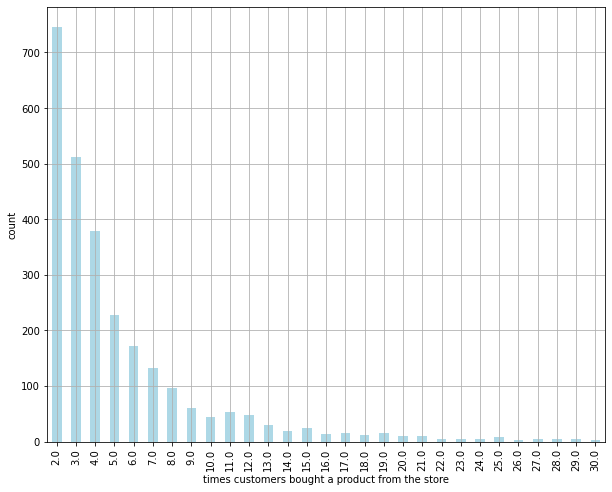

In [186]:
summary_df = summary_df.loc[summary_df["invoicedate_purchase_duration"]>0]

sales_count = summary_df.groupby("sales_count").count()
sales_count["sales_avg"][:30].plot(kind="bar", color="lightblue", figsize=(10, 8), grid=True)
plt.ylabel("count")
plt.xlabel("times customers bought a product from the store");


Majority of customers makes a few purchases. And as purchasing time increases, the amount of customers decreases, as would normally be expected

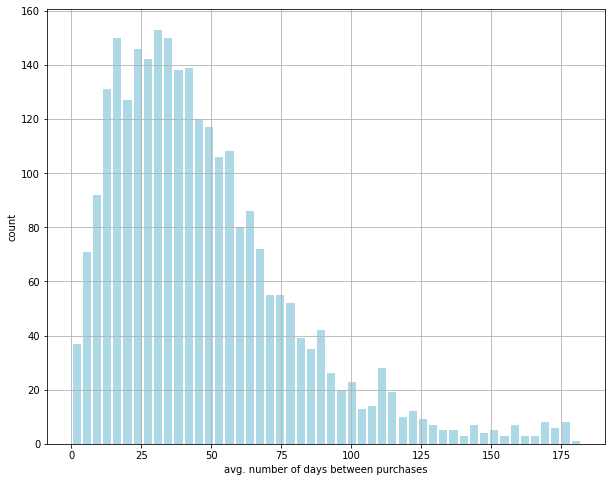

In [187]:
summary_df["invoicedate_purchase_frequency"].plot(kind="hist", bins=50, color="lightblue", figsize=(10, 8), rwidth=0.8, grid=True)
plt.xlabel("avg. number of days between purchases")
plt.ylabel("count");

The majority of customers spends between 15 and 50 days before making the next purchase. After that the more time passes, the less likely are people to buy from the store

###Predicting the 3 Month Customer Lifetime Value

In [188]:
orders_df.head()

Sales         InvoiceDate
CustomerID InvoiceNo                              
12346.0    541431     77183.60 2011-01-18 10:01:00
12347.0    537626       711.79 2010-12-07 14:57:00
           542237       475.39 2011-01-26 14:30:00
           549222       636.25 2011-04-07 10:43:00
           556201       382.52 2011-06-09 13:01:00

In [189]:
#create summary statistics in 3 month intervals for customer Sales

data_df = orders_df.reset_index().groupby(["CustomerID", pd.Grouper(key="InvoiceDate", freq="3M")]).agg({
    "Sales": [sum, groupby_mean, groupby_count]
})

data_df.columns = ["_".join(col).lower() for col in data_df.columns]
data_df = data_df.reset_index()
data_df.head()

,CustomerID,InvoiceDate,sales_sum,sales_avg,sales_count
0,12346.0,2011-03-31,77183.60,77183.600,1.0
1,12347.0,2010-12-31,711.79,711.790,1.0
2,12347.0,2011-03-31,475.39,475.390,1.0
3,12347.0,2011-06-30,1018.77,509.385,2.0
4,12347.0,2011-09-30,584.91,584.910,1.0


In [190]:
#Adding Recency 'M'

date_month_map = {str(x)[:10]: "M_%s" % (i+1) for i, x in enumerate(sorted(data_df.reset_index()["InvoiceDate"].unique(), reverse=True))}

#create M colummn

data_df["M"] = data_df["InvoiceDate"].apply(lambda x: date_month_map[str(x)[:10]])
data_df.head()

,CustomerID,InvoiceDate,sales_sum,sales_avg,sales_count,M
0,12346.0,2011-03-31,77183.60,77183.600,1.0,M_4
1,12347.0,2010-12-31,711.79,711.790,1.0,M_5
2,12347.0,2011-03-31,475.39,475.390,1.0,M_4
3,12347.0,2011-06-30,1018.77,509.385,2.0,M_3
4,12347.0,2011-09-30,584.91,584.910,1.0,M_2


In [191]:
data_df["M"].unique()

array(['M_4', 'M_5', 'M_3', 'M_2', 'M_1'], dtype=object)

###RFM

* **Recency**: how recently did customer purchase?
* **Frequency**: how often does customer purchace?
* **Monetary Value**: how much do they spend each time on average?

In [192]:
#Create Features DF

features_df = pd.pivot_table(data_df.loc[data_df["M"] != "M_1"], values=["sales_sum", "sales_avg", "sales_count"], columns="M", index="CustomerID")

features_df.columns = [" ".join(col) for col in features_df.columns]

features_df.head()

,sales_avg M_2,sales_avg M_3,sales_avg M_4,sales_avg M_5,sales_count M_2,sales_count M_3,sales_count M_4,sales_count M_5,sales_sum M_2,sales_sum M_3,sales_sum M_4,sales_sum M_5
CustomerID,,,,,,,,,,,,
12346.0,NaN,NaN,77183.600,NaN,NaN,NaN,1.0,NaN,NaN,NaN,77183.60,NaN
12347.0,584.91,509.385,475.390,711.79,1.0,2.0,1.0,1.0,584.91,1018.77,475.39,711.79
12348.0,310.00,367.000,227.440,892.80,1.0,1.0,1.0,1.0,310.00,367.00,227.44,892.80
12350.0,NaN,NaN,334.400,NaN,NaN,NaN,1.0,NaN,NaN,NaN,334.40,NaN
12352.0,316.25,NaN,312.362,NaN,2.0,NaN,5.0,NaN,632.50,NaN,1561.81,NaN


In [193]:
#Response DF

response_df = data_df.loc[data_df["M"]=="M_1", ["CustomerID", "sales_sum"]]

response_df.columns = ["CustomerID", "CLV_M"]
response_df.head()

,CustomerID,CLV_M
5,12347.0,1294.32
10,12349.0,1757.55
14,12352.0,311.73
20,12356.0,58.35
21,12357.0,6207.67


In [194]:
#create sample set by merging features with response_df

sample_set_df = features_df.merge(
    response_df,
    left_index=True,
    right_on="CustomerID",
    how="left"
)


sample_set_df = sample_set_df.fillna(0)
sample_set_df.head()

,sales_avg M_2,sales_avg M_3,sales_avg M_4,sales_avg M_5,sales_count M_2,sales_count M_3,sales_count M_4,sales_count M_5,sales_sum M_2,sales_sum M_3,sales_sum M_4,sales_sum M_5,CustomerID,CLV_M
NaN,0.00,0.000,77183.600,0.00,0.0,0.0,1.0,0.0,0.00,0.00,77183.60,0.00,12346.0,0.00
5.0,584.91,509.385,475.390,711.79,1.0,2.0,1.0,1.0,584.91,1018.77,475.39,711.79,12347.0,1294.32
NaN,310.00,367.000,227.440,892.80,1.0,1.0,1.0,1.0,310.00,367.00,227.44,892.80,12348.0,0.00
NaN,0.00,0.000,334.400,0.00,0.0,0.0,1.0,0.0,0.00,0.00,334.40,0.00,12350.0,0.00
14.0,316.25,0.000,312.362,0.00,2.0,0.0,5.0,0.0,632.50,0.00,1561.81,0.00,12352.0,311.73


###Use Linear Regression

In [195]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

target_var = "CLV_M"

all_features = [x for x in sample_set_df.columns if x not in ["CustomerID", target_var]]

x_train, x_test, y_train, y_test = train_test_split(sample_set_df[all_features], sample_set_df[target_var], test_size=0.3)


reg_fit = LinearRegression()
reg_fit.fit(x_train, y_train)

LinearRegression()

In [196]:
reg_fit.intercept_

40.39391981333432

In [197]:
reg_fit.coef_

array([ 3.61085055e-01, -3.72199784e-01, -3.80363394e-01, -8.27365542e-02,
        1.34929497e+02,  4.01917905e+01, -1.41784748e+02, -1.47149197e+01,
        1.68870653e-01,  2.16241779e-01,  3.95739940e-01,  6.17707700e-01])

In [198]:
#coef per feature


coef = pd.DataFrame(list(zip(all_features, reg_fit.coef_)))
coef.columns = ["feature", "coef"]

coef

,feature,coef
0,sales_avg M_2,0.361085
1,sales_avg M_3,-0.372200
2,sales_avg M_4,-0.380363
3,sales_avg M_5,-0.082737
4,sales_count M_2,134.929497
5,sales_count M_3,40.191790
6,sales_count M_4,-141.784748
7,sales_count M_5,-14.714920
8,sales_sum M_2,0.168871
9,sales_sum M_3,0.216242


In [199]:
#run input data into model predictors


train_preds = reg_fit.predict(x_train)
test_preds = reg_fit.predict(x_test)

In [200]:
#access performance

from sklearn.metrics import r2_score, median_absolute_error

print(r2_score(y_true=y_train, y_pred=train_preds))
print(median_absolute_error(y_true=y_train, y_pred=train_preds))

0.6847411827893407
229.39413952595675


In [201]:
print('In-Sample R-Squared: %0.4f' % r2_score(y_true = y_train, y_pred = train_preds))
print('Out-of-Sample R-Squared: %0.4f' % r2_score(y_true = y_test, y_pred = test_preds))

In-Sample R-Squared: 0.6847
Out-of-Sample R-Squared: 0.7869


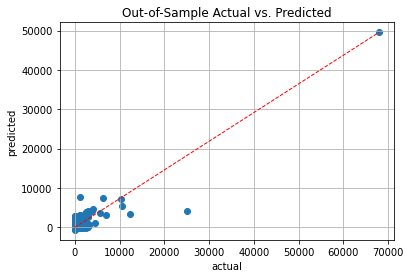

In [202]:
# Plot the predicted vs actual values using our Test Dataset
plt.scatter(y_test, test_preds)
plt.plot([0, max(y_test)], [0, max(test_preds)], color='red', lw=1, linestyle='--')

plt.xlabel('actual')
plt.ylabel('predicted')
plt.title('Out-of-Sample Actual vs. Predicted')
plt.grid()

plt.show()